## Importar las librerias necesarias

<p>Para esta parte del proyecto que se denominara EDA(Exploratory Data Analysis), se usaran las herramientas de las librerias <strong> pandas, ydata-profiling, wrangler, matplotlib y seaborn, </strong>con el fin de analizar de manera detallada los datos que se usaran en el entrenamiento del modelo. Estos datos que han sido preparados en la instancia anterior llamada ETL y almacenados en una base de datos SQLite seran cargados a traves de una conexion realizada con la libreria <strong>sqlalchemy</strong>.</p>

### Importar las librerias a usar.

In [19]:
# Librerias a utilizar durante los procesos.
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from ydata_profiling import ProfileReport
from sqlalchemy import create_engine
from wordcloud import WordCloud

%matplotlib inline

### Conexion a la base de datos.

In [2]:
# Conexion a la base de datos.
engine = create_engine('sqlite:///../API/data/movies.db')

> Con el fin de analizar los datos almacenados se realiza una conexion a la base de datos.

## Importar datos de la base de datos.

In [3]:
# Crear Dataframe directors con los datos.
directors = pd.read_sql('unique_directors', engine)
directors


,director_id,name
0,4463,aamir khan
1,5020,aarne tarkas
2,5480,aaron aites
3,16023,aaron biebert
4,2772,aaron blaise
...,...,...
16631,12146,zoltan spirandelli
16632,11283,zoran lisinac
16633,5792,zoya akhtar
16634,14042,zrinko ogresta


> una vez importado los datos se agrega a la tala un nuevo registro 'desconocido', con el fin de unir las tablas y aquellas peliculas que no cuenten con un director se le agregara el valor de 'desconocido'.

In [4]:
# Obtener el id maximo para tener una referencia y crear el registro de director desconocido.
directors['director_id'].max()

np.int64(16636)

In [5]:
# Crear registro de director desconocido en directors.
directors.loc[16637] = [99999, 'desconocido']

In [6]:
# Verificar el nuevo dato.
directors_ = directors[directors['name'] == 'desconocido']
directors_

,director_id,name
16637,99999,desconocido


### Cargar tabla de peliculas.

In [7]:
# Crear Dataframe movie con los registros de las peliculas.
movies = pd.read_sql_table('movie', engine)
movies

,budget,movie_id,original_language,overview,popularity,release_date,revenue,runtime,title,vote_average,vote_count,genres_clean,production_companies_clean,production_countries_clean,retorno_de_inversion,release_year,director_id
0,0.0,2,fi,Taisto Kasurinen is a Finnish coal miner whose...,3.860491,1988-10-21,0.0,69.0,ariel,7.1,44.0,"Drama, Crime","Villealfa Filmproduction Oy, Finnish Film Foun...",Finland,0.000000,1988,NaN
1,0.0,3,fi,"An episode in the life of Nikander, a garbage ...",2.292110,1986-10-16,0.0,76.0,shadows in paradise,7.1,35.0,"Drama, Comedy",Villealfa Filmproduction Oy,Finland,0.000000,1986,NaN
2,4000000.0,5,en,It's Ted the Bellhop's first night on the job....,9.026586,1995-12-09,4300000.0,98.0,four rooms,6.5,539.0,"Crime, Comedy","Miramax Films, A Band Apart",United States of America,1.075000,1995,18.0
3,0.0,6,en,"While racing to a boxing match, Frank, Mike, J...",5.538671,1993-10-15,12136938.0,110.0,judgment night,6.4,79.0,"Action, Thriller, Crime","Universal Pictures, Largo Entertainment, JVC E...","Japan, United States of America",0.000000,1993,348.0
4,11000000.0,11,en,Princess Leia is captured and held hostage by ...,42.149697,1977-05-25,775398007.0,121.0,star wars,8.1,6778.0,"Adventure, Action, Science Fiction","Lucasfilm, Twentieth Century Fox Film Corporation",United States of America,70.490728,1977,228.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31943,0.0,464111,en,"Stranded in an Arctic mine, two survivors are ...",3.214001,2017-07-12,0.0,23.0,zygote,7.2,28.0,"Horror, Science Fiction",Oats Studio,Canada,0.000000,2017,5076.0
31944,0.0,464207,en,"William Shatner sits down with scientists, inn...",1.075249,2017-05-01,0.0,86.0,the truth is in the stars,7.5,2.0,Documentary,NoData,Canada,0.000000,2017,16489.0
31945,0.0,465044,en,A horror comedy spoofing conspiracy theory mov...,0.281008,2017-06-28,0.0,90.0,abduction,0.0,0.0,"Fantasy, Drama",NoData,United Kingdom,0.000000,2017,16486.0
31946,0.0,467731,en,Fifteen-year-old girl Dotty Fisher is assaulte...,0.001189,1956-02-19,0.0,60.0,tragedy in a temporary town,0.0,0.0,Drama,NoData,United States of America,0.000000,1956,373.0


In [8]:
# Reemplazar valores nulos con el id 99999
movies['director_id'] = movies['director_id'].fillna(99999)

> Mediante el metodo fillna se agregan en los valores nulos el id 99999 que pertenece al registro 'desconocido' creado previamente. 

In [9]:
# Verificar los registros de la tabla.
null =movies[movies['director_id'] == 99999]
null

,budget,movie_id,original_language,overview,popularity,release_date,revenue,runtime,title,vote_average,vote_count,genres_clean,production_companies_clean,production_countries_clean,retorno_de_inversion,release_year,director_id
0,0.0,2,fi,Taisto Kasurinen is a Finnish coal miner whose...,3.860491,1988-10-21,0.0,69.0,ariel,7.1,44.0,"Drama, Crime","Villealfa Filmproduction Oy, Finnish Film Foun...",Finland,0.000000,1988,99999.0
1,0.0,3,fi,"An episode in the life of Nikander, a garbage ...",2.292110,1986-10-16,0.0,76.0,shadows in paradise,7.1,35.0,"Drama, Comedy",Villealfa Filmproduction Oy,Finland,0.000000,1986,99999.0
22,2000000.0,55,es,Three different people in Mexico City are cata...,5.958138,2000-06-16,20908467.0,154.0,amores perros,7.6,537.0,"Drama, Thriller","Altavista Films, Zeta Film",Mexico,10.454234,2000,99999.0
25,9285469.0,64,es,Two men share an odd friendship while they car...,6.648278,2002-03-14,51001550.0,112.0,talk to her,7.5,273.0,"Drama, Romance","Vía Digital, Good Machine, El Deseo S.A., Ante...",Spain,5.492620,2002,99999.0
28,0.0,67,en,Paradise Now is filmed from the perspective of...,3.714186,2005-02-14,3357075.0,90.0,paradise now,6.9,63.0,"Thriller, Crime, Drama","Lama Films, Augustus Film, Lama Productions, L...","Palestinian Territory, France, Germany, Israel...",0.000000,2005,99999.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31915,0.0,455363,en,A behind-the-scenes look at the building of th...,0.001178,1958-01-01,0.0,6.0,the rise and fall of a jungle giant,0.0,0.0,Documentary,NoData,United States of America,0.000000,1958,99999.0
31920,0.0,456018,en,Two chefs in DC struggle to open and maintain ...,0.032991,2016-03-05,0.0,96.0,new chefs on the block,0.0,0.0,NoData,NoData,NoData,0.000000,2016,99999.0
31930,0.0,460024,en,After a night out of partying and left behind ...,6.868237,2017-06-02,0.0,84.0,stasis,4.0,37.0,"Adventure, Science Fiction","Vangard Productions, PraxiScope Productions",United States of America,0.000000,2017,99999.0
31934,0.0,461533,en,"Interviews about the film ""Meanwhile"" with dir...",0.010588,2013-04-23,0.0,15.0,the everyday,0.0,0.0,Documentary,Possible Films,United States of America,0.000000,2013,99999.0


> se verifican los datos que contienen el registro 999999 en director_id de la tabla movie y se evalua que todo vaya bien.

### Merge de tablas.

In [10]:
# Merge de tablas mediante el director_id
data = pd.merge(movies,directors, on='director_id', how='inner')
data

,budget,movie_id,original_language,overview,popularity,release_date,revenue,runtime,title,vote_average,vote_count,genres_clean,production_companies_clean,production_countries_clean,retorno_de_inversion,release_year,director_id,name
0,0.0,2,fi,Taisto Kasurinen is a Finnish coal miner whose...,3.860491,1988-10-21,0.0,69.0,ariel,7.1,44.0,"Drama, Crime","Villealfa Filmproduction Oy, Finnish Film Foun...",Finland,0.000000,1988,99999.0,desconocido
1,0.0,3,fi,"An episode in the life of Nikander, a garbage ...",2.292110,1986-10-16,0.0,76.0,shadows in paradise,7.1,35.0,"Drama, Comedy",Villealfa Filmproduction Oy,Finland,0.000000,1986,99999.0,desconocido
2,4000000.0,5,en,It's Ted the Bellhop's first night on the job....,9.026586,1995-12-09,4300000.0,98.0,four rooms,6.5,539.0,"Crime, Comedy","Miramax Films, A Band Apart",United States of America,1.075000,1995,18.0,allison anders
3,0.0,6,en,"While racing to a boxing match, Frank, Mike, J...",5.538671,1993-10-15,12136938.0,110.0,judgment night,6.4,79.0,"Action, Thriller, Crime","Universal Pictures, Largo Entertainment, JVC E...","Japan, United States of America",0.000000,1993,348.0,stephen hopkins
4,11000000.0,11,en,Princess Leia is captured and held hostage by ...,42.149697,1977-05-25,775398007.0,121.0,star wars,8.1,6778.0,"Adventure, Action, Science Fiction","Lucasfilm, Twentieth Century Fox Film Corporation",United States of America,70.490728,1977,228.0,george lucas
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31943,0.0,464111,en,"Stranded in an Arctic mine, two survivors are ...",3.214001,2017-07-12,0.0,23.0,zygote,7.2,28.0,"Horror, Science Fiction",Oats Studio,Canada,0.000000,2017,5076.0,neill blomkamp
31944,0.0,464207,en,"William Shatner sits down with scientists, inn...",1.075249,2017-05-01,0.0,86.0,the truth is in the stars,7.5,2.0,Documentary,NoData,Canada,0.000000,2017,16489.0,craig thompson
31945,0.0,465044,en,A horror comedy spoofing conspiracy theory mov...,0.281008,2017-06-28,0.0,90.0,abduction,0.0,0.0,"Fantasy, Drama",NoData,United Kingdom,0.000000,2017,16486.0,molly smith
31946,0.0,467731,en,Fifteen-year-old girl Dotty Fisher is assaulte...,0.001189,1956-02-19,0.0,60.0,tragedy in a temporary town,0.0,0.0,Drama,NoData,United States of America,0.000000,1956,373.0,sidney lumet


> se realiza un merge de las tablas para poder unificarlas y tener todos los registros en una sola y facilitar los posteriores analisis, dejando un total de 31948 registros con 18 variables en total.

### Aplicacion de librerias como Ydata-profiling y Wrangler para el analisis detallado de los datos.

In [11]:
ydata = ProfileReport(data)
# datos.to_file("movies_data.html")
ydata



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Analisis preliminar.

<p>Al detallar las diferentes variables se pueden contemplar los siguientes aspectos:<br>
<ul>
    <ul><strong>Variables que representan ID:</strong>
        <li>
            movie_id
        </li>
        <li>
            director_id
        </li>
    </ul>
    <ul><strong>variables con filas que tienen un valor = 0 que representan mas del 75% de los datos:</strong>
        <li>
            budget 77% de los datos es igual a 0 
        </li>
        <li>
            revenue el 81% de los datos es igual a 0
        </li>
        <li>
            retorno_de_inversion 86% de los datos es igual a 0
        </li>
    </ul>
      <ul><strong>variable que representa una fecha:</strong>
        <li>
            release_date (Fecha de lanzamiento)
        </li>
        <li>
            release_year (año de lanzamiento)
        </li>
    </ul>       
</ul>

> Tomando en cuenta este primer analisis se puede deducir lo siguiente con respecto a cada grupo de variables.<hr>
<p>En el primer grupo de variables '<strong>Variables que representan ID:</strong>' se cuentan con variables de identificacion unica 'id' que no aportarian valor categorico al modelo a entrenar y que por el contrario complejizarian al modelo de manera redundante e inecesaria.</p><hr>
<p>En el segundo grupo de variables '<strong>variables con filas que tienen un valor = 0 que representan mas del 75% de los datos:</strong>' se puede contemplar un gran numero de datos con valor de 0(cero) que superan el tercio del total de los datos (75% en adelante), lo que representaria un problema para intentar realizar un tratamiento adecuado para mantener dichas columnas y de mantenerse generarian algun tipo de imprecision durante el entrenamiento del modelo a utilizar</p><hr>
<p>En el tercer grupo de variables '<strong>variable que representa una fecha:</strong>' se puede contemplar un gran numero de datos con valor de 0(cero) que superan el tercio del total de los datos (75% en adelante), lo que representaria un problema para intentar realizar un tratamiento adecuado para mantener dichas columnas y de mantenerse generarian algun tipo de imprecision durante el entrenamiento del modelo a utilizar</p><hr>


## Diagrama de variable budget

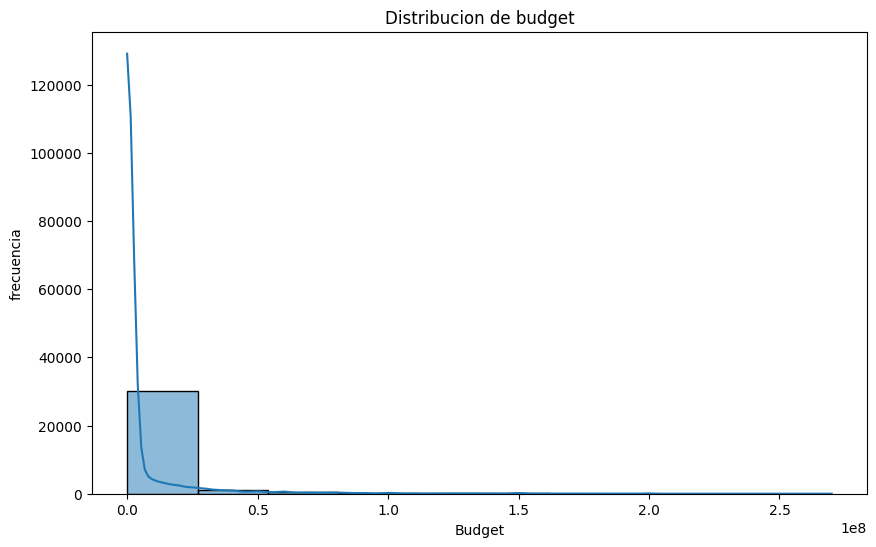

In [27]:
# Matploitlib para visualizar la frecuencia de los datos y la pendiente que representa.
plt.figure(figsize=(10, 6))
sns.histplot(data['budget'], bins=10, kde=True)
plt.xlabel('Budget')
plt.ylabel('frecuencia')
plt.title('Distribucion de budget')
plt.show()


## Diagrama de variable Retorno de Inversion

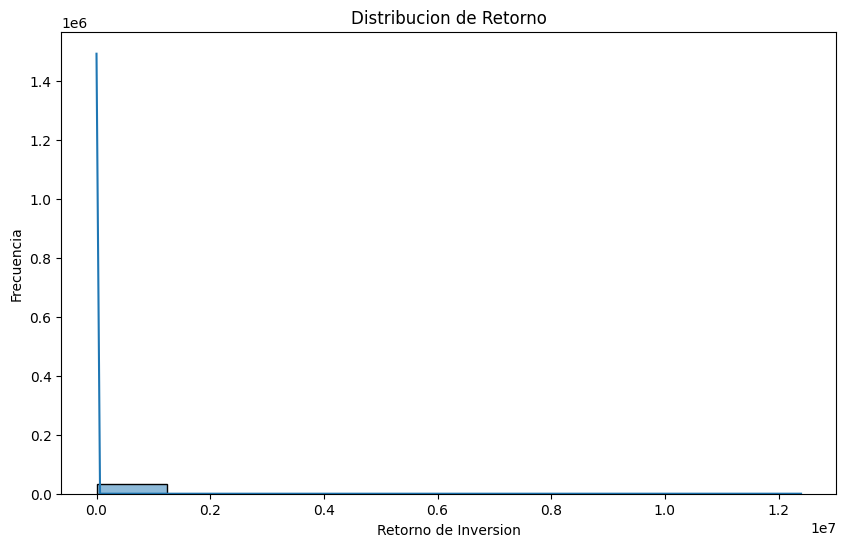

In [28]:
# Matploitlib para visualizar la frecuencia de los datos y la pendiente que representa.
plt.figure(figsize=(10, 6))
sns.histplot(data['retorno_de_inversion'], bins=10, kde=True)
plt.xlabel('Retorno de Inversion')
plt.ylabel('Frecuencia')
plt.title('Distribucion de Retorno')
plt.show()


## Variable revenue

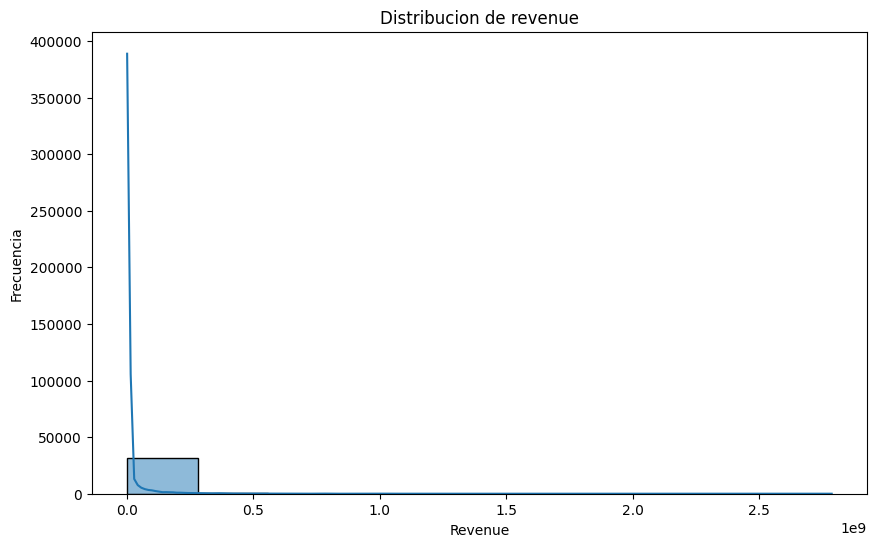

In [29]:
# Matploitlib para visualizar la frecuencia de los datos y la pendiente que representa.
plt.figure(figsize=(10, 6))
sns.histplot(data['revenue'], bins=10, kde=True)
plt.xlabel('Revenue')
plt.ylabel('Frecuencia')
plt.title('Distribucion de revenue')
plt.show()

## Analisis de las variables categoricas.

<p> En la </p>

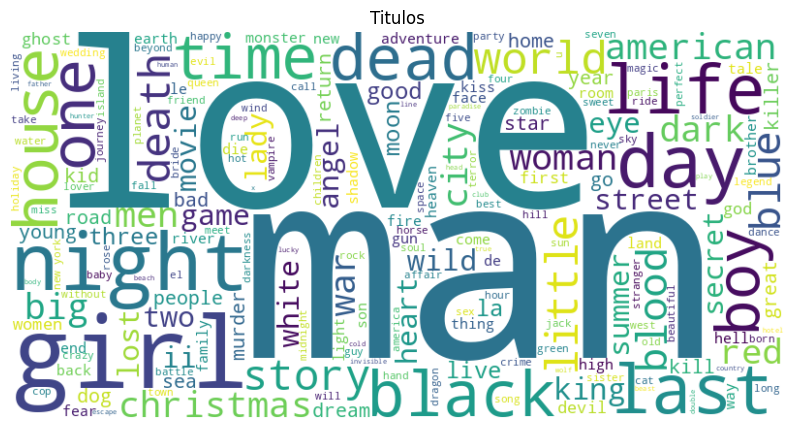

In [36]:
text = ' '.join(data['title'].tolist())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar la nube de palabras usando Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Titulos')
plt.show()

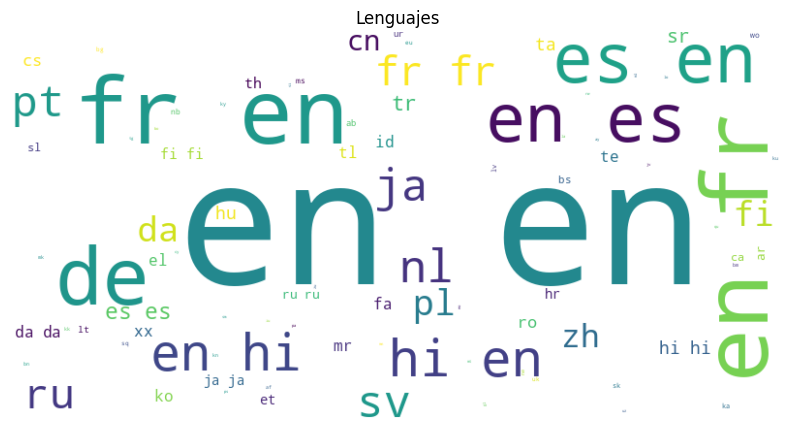

In [35]:
text = ' '.join(data['original_language'].tolist())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar la nube de palabras usando Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Lenguajes')
plt.show()

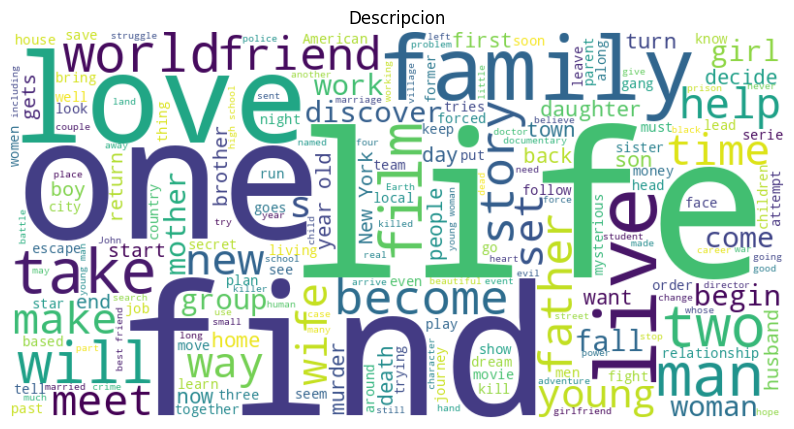

In [37]:
text = ' '.join(data['overview'].tolist())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar la nube de palabras usando Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Descripcion')
plt.show()

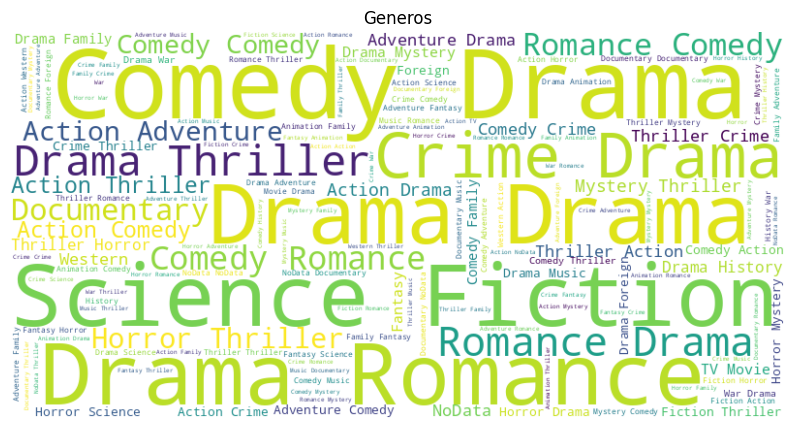

In [39]:
text = ' '.join(data['genres_clean'].tolist())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar la nube de palabras usando Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Generos')
plt.show()

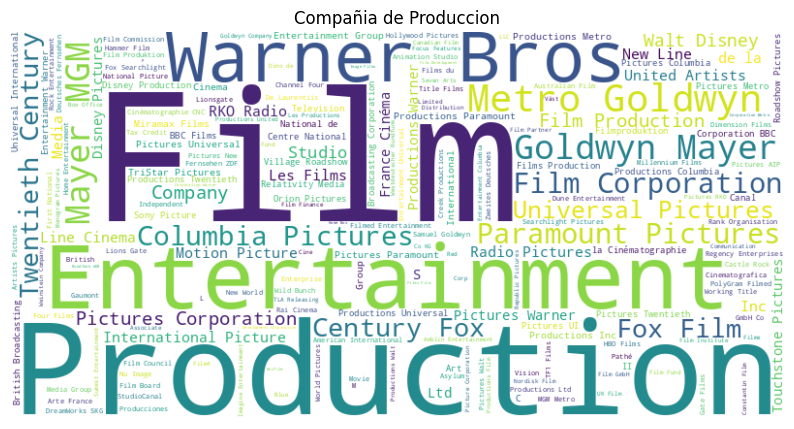

In [48]:
compañias_filtradas = data['production_companies_clean'][data['production_companies_clean'] != 'NoData']
text = ' '.join(compañias_filtradas.tolist())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar la nube de palabras usando Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Compañia de Produccion')
plt.show()

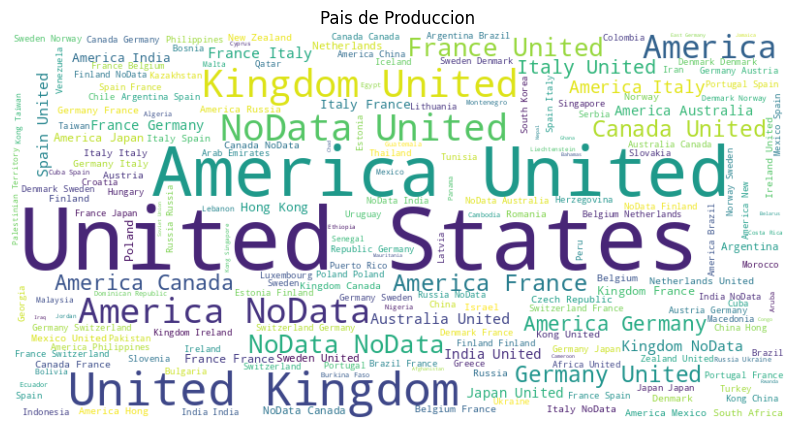

In [44]:
text = ' '.join(data['production_countries_clean'].tolist())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar la nube de palabras usando Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Pais de Produccion')
plt.show()

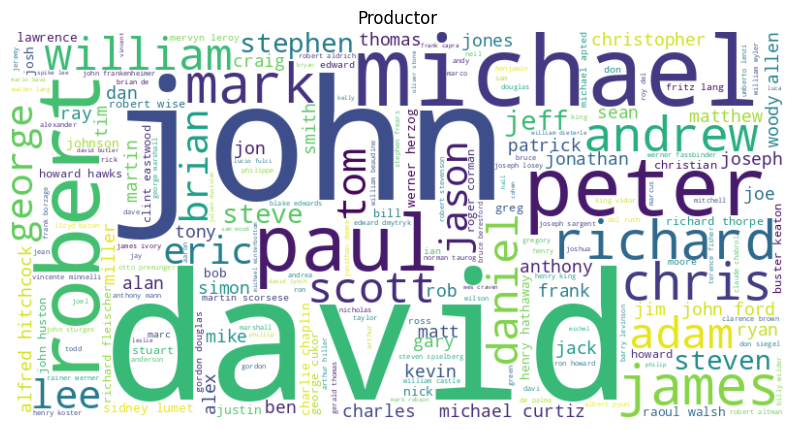

In [47]:
nombres_filtrados = data['name'][data['name'] != 'desconocido']
text = ' '.join(nombres_filtrados.tolist())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar la nube de palabras usando Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Productor')
plt.show()